In [16]:
## Notebook to develop toy model of dynamics to be used as input simulator to a constrained generative model. 
## Dynamics are given by a ball that is subject to gravity and moves around in 2d. 

In [1]:
## List of imports (keep it simple)
import numpy as np
import scipy 
from scipy.integrate import odeint
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import glob
import os
import subprocess

In [2]:
## List of parameters
dim = 2 #dimensionality of the problem
g = 0 #m/(s^2) (gravitational constant)
d = 20 # size of a square enclosure
t = 100 # time to simulate for ('seconds')
dt = 2500 # steps per second
w = 20
h = 20
dpi = 4
nb_backgrounds = 1000
env_params = {'dimension':dim,
              'grav_constant':g,
              'enclosure_size':d,
              'simtime':t,
              'timesteps':dt*t,
              'dpi':dpi}


A = np.zeros((4,4))
A[2,0] = 1
A[3,1] = 1 ## dynamics matrix
e = 1 ## reduction in force 
dyn_params = {'grav_constant':g,'dyn_matrix':A,'elasticity':e}

m = 10.0 # mass of ball
r = 15*env_params['enclosure_size'] # radius of ball

ball_params = {'mass':m,'radius':r}




In [3]:
## In order to set up numerical integration, we need a callable function that calculates derivatives of the movement
## as a set of first order differential equations. Thus we define the following

## Define a form on forces as an external effect (we need a form that will return a value for non-integer evaluated 
## points in t):

def ball(y,t,env_params,dyn_params,ball_params,F):
    
    # Define Effect of forces
    # We have the forces determined as Fx and Fy, a sequence that the input gets to see
    # Determine effect of forces:
    F_vec = np.zeros((4))
    F_vec[3] -= dyn_params['grav_constant']*ball_params['mass'] ## Effect of gravity
    F_vec[2:4] += F(t) ## Deterministic exterior force being applied
    
    ## We want elasticity: 
    if np.any(abs(y[0:2])>env_params['enclosure_size']):
        F_imp = dyn_params['elasticity']*(abs(y[0:2])>env_params['enclosure_size'])*100000 ## Bounce back
        F_elast = F_imp*-np.sign(y[0:2])
  
    else:
        F_elast = np.zeros((2))
    F_vec[2:4] += F_elast
    
    ## F = ma
    a_vec = F_vec/ball_params['mass']
    
    ## Write down the full dynamics equation:
    ydot = np.dot(y,dyn_params['dyn_matrix'])+a_vec

    return ydot



In [4]:
## Solve for given F,y0,t
# F = lambda t: np.array([100*np.sin(t),100*np.cos(t)])
# F = lambda t: np.array([np.sin(3*t),np.cos(3*t)])
F = lambda t: np.array([0,0])
y0 = np.zeros((4))
# y0[2]-= (1./3)/10
# y0[0]-=20
t = np.linspace(0,nb_backgrounds*env_params['simtime'],env_params['timesteps'])
sol = odeint(ball, y0, t, args=(env_params,dyn_params,ball_params,F))

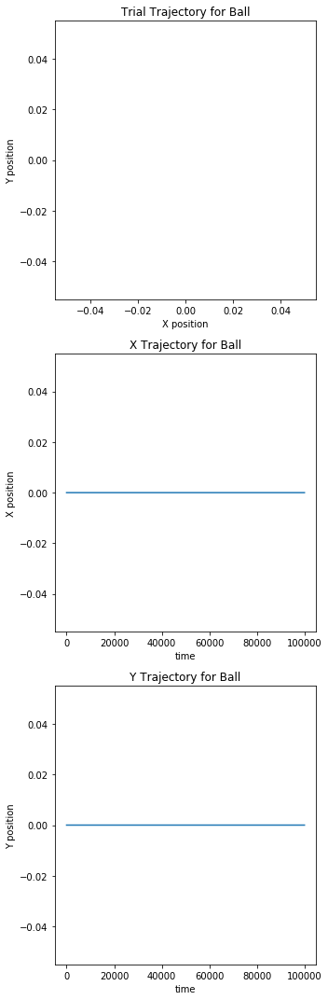

In [5]:
fig,ax = plt.subplots(3,1,figsize = (5,15))
ax[0].plot(sol[:,0],sol[:,1])
ax[0].set_title('Trial Trajectory for Ball')
ax[0].set_xlabel('X position')
ax[0].set_ylabel('Y position')
ax[1].plot(t,sol[:,0])
ax[1].set_title('X Trajectory for Ball')
ax[1].set_xlabel('time')
ax[1].set_ylabel('X position')
ax[2].plot(t,sol[:,1])
ax[2].set_title('Y Trajectory for Ball')
ax[2].set_xlabel('time')
ax[2].set_ylabel('Y position')
plt.tight_layout()
plt.show()

In [6]:
# # Render a background (static for now)
# # background = np.concatenate([np.ones((2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,1))*i for i in [0.5,0.7,0.1]],axis = -1)
# background = (np.random.rand(2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,3))

# ## We design a covariance matrix that is spatially correlated gaussian noise: 
# # We choose a squared exponential kernel: 
# length_covar = (2*env_params['enclosure_size']+1)**2
# index = np.arange(length_covar)
# ## Make a meshgrid to evaluate:
# xx,yy = np.meshgrid(index,index)

# diff = abs(xx-yy)
# gamma = 6
# distances = np.exp(-(np.floor(diff/(2*env_params['enclosure_size']+1))**2+np.mod(diff,(2*env_params['enclosure_size'])+1)**2)/gamma)
# mat = distances+np.eye(length_covar)*2
# ## Now sample uniform noise:
# array = np.zeros((length_covar,3))
# for i in range(3):
#     noise = np.random.multivariate_normal(np.zeros((length_covar,))+0.5,mat)
#     noise = (noise-np.min(noise))/np.max(noise-np.min(noise))
#     array[:,i] = noise
# # corr_noise = np.dot(chol,noise).reshape(env_params['width'],env_params['height'],3)
# # corr_noise_min = [np.min(corr_noise[:,:,i]) for i in range(1)]
# # corr_noise = corr_noise-corr_noise_min
# # corr_noise_max = [np.max(corr_noise[:,:,i]) for i in range(1)]

# # corr_noise = corr_noise/corr_noise_max

# # plt.imshow(corr_noise[:,:,0])
# plt.imshow(array.reshape(2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,3))
# background = array.reshape(2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,3)

In [7]:
## Turn the above into a function. 
## Inputs:
# imsize: width or height of image
# nb_w: number of plane waves to use per color channel (rgb)
# nb_knobs: dimensionality for the low-d parametrization of images
# nb_knobset: number of samples to take of those parameter values (sampled random uniform)
# alpha: overall scaling factor on sampled parameters (knobs)
# beta: additive constant for sampled parameters (knobs)

## Outputs:
## images: (nb_knobset images of shape(imsize,imsize,3))
## knobs: the settings of parameters that generated these images.
def imgen(imsize=64,nb_w = 50,nb_knobs = 2,nb_knobset = 30,alpha = 5,beta = 0,knobs = None,loading = None):
    ## Define xx and yy grids that will make functions easier to define
    x = np.linspace(0,10,imsize)
    y = np.linspace(0,10,imsize)

    xx,yy = np.meshgrid(x,y)
    
    ## Define lambda function that takes you from parameter space into plane waves:
    
    ## This is like sampling points randomly in 2-d fourier space, and then looking at the corresponding images. 
    
    ## Each element of the fourier series that we consier is a "plane wave" that is characterized by four parameters. 
    ## These parameters are: 
    ## 1. Amplitude: given a hard limit of 0,1, we rescale all amplitudes to be centered on 0.5 with corresponding baseline 
    ## amplitude, the parameter here is a scale that varies plane wave amplitudes relative to one another.
    ## 2. Phase: this parameter just describes the shift of the plane wave phase relative to some baseline. 
    ## 3. Period: multiply by some factor of two pi. otherwise unconstrained. 
    ## 4. Angle: a scalar value that determines the degree to which the plane wave varies in the x and y direction. the angle 
    ## should be transformed as sin and cosine to ensure uniformity in some sense 
    
    wave = lambda params: params[0]*np.sin(params[2]*(np.sin(params[3])*xx+np.cos(params[3])*yy+params[1]+0.5))

    ## Define a loading matrix to transform our low-d thing into parameters for a set of waves
    if loading is not None:
        loading_matrix = loading
    else:
        loading_matrix = np.random.uniform(size = (4,nb_knobs,3*nb_w))
    
    ## If the values of the parameters are given, use those. If not, generate from uniform (scaled appropriately)
    if knobs is not None:
        params = knobs
    else: 
        params = alpha*np.random.uniform(size = (nb_knobset,nb_knobs))+beta#np.linspace(0,10,nb_knobset*nb_knobs).reshape(nb_knobset,nb_knobs)
    
    params_transformed = np.dot(params,loading_matrix)
    
    ## Now iterate through plane waves, collapse into channels, normalize and collapse into images.
    allind = range(nb_knobset)
    all_images = []
    for i in allind:
        relevant_params = params_transformed[i,:,:]
        grids = np.array([wave(relevant_params[:,i]) for i in range(3*nb_w)])
        ## Now split into channels:
        channelcomponents = np.split(grids,3,axis = 0)
        ## Now collapse each:
        channels = [np.sum(channelcomp,axis = 0)/float(nb_w) for channelcomp in channelcomponents]
        ## Now normalize each:
        normchannels = [(channel-np.min(channel))/(np.max(channel)-np.min(channel)) for channel in channels]
        ## combine into an image:
        image = np.stack(normchannels,axis = -1)
        all_images.append(image)
    return all_images,params,loading_matrix

In [10]:
video_title = 'Video_ball_color_many_backs'
# loadmat = np.load(video_title+'loadmat.npy')
# params = np.load(video_title+'params.npy')
backgrounds,params,loadmat = imgen(imsize = 2*env_params['enclosure_size']+1,nb_knobset = nb_backgrounds)

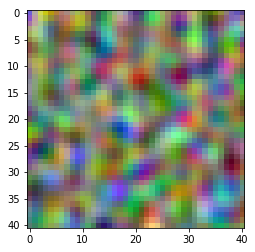

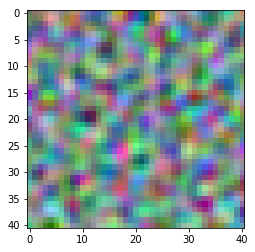

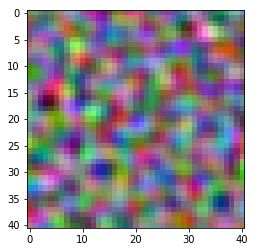

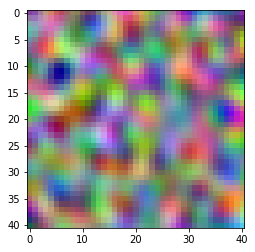

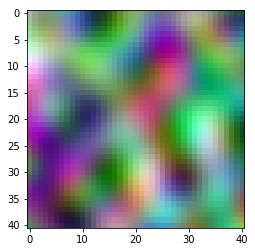

...

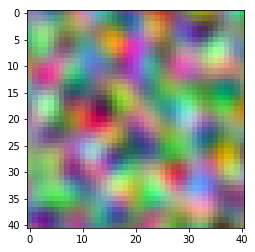

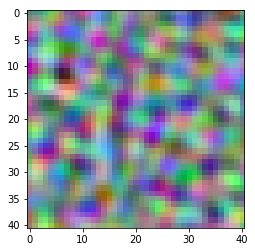

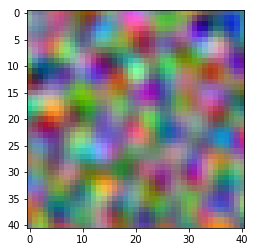

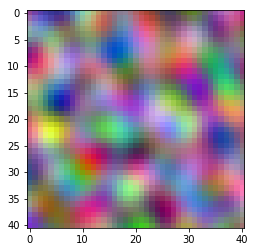

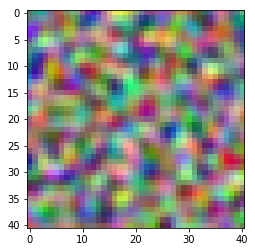

In [11]:
for i in range(nb_backgrounds):
    plt.imshow(backgrounds[i])
    plt.show()
    


In [ ]:
# Generate frames for a video:
all_datadirect = 'datadirectory'
try:
    os.mkdir(all_datadirect)
except:
    print('all data directory already exists!')

videodirectory = 'toydynamics_nograv'
try:
    os.mkdir(all_datadirect+'/'+videodirectory)
except:
    print('Directory already exists!')

# Sample at the seconds timescale:
frames = np.linspace(0,env_params['timesteps']-1,nb_backgrounds*env_params['simtime']).astype('int')
print('Generating Frames')

# Preprocess 
sol[sol>(env_params['enclosure_size']-0.5)]=env_params['enclosure_size']-0.5
sol[sol<(-env_params['enclosure_size']+0.5)]=-env_params['enclosure_size']+0.5
# sol[sol<-31.5]=-31.5

period = 2*np.pi*1./47.431
background = (np.random.rand(2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,3))


## Iterate over backgrounds:
for j in range(nb_backgrounds):
    if j == 0:
        np.save(video_title+'loadmat',loadmat)
        np.save(video_title+'params',params)
        np.save(video_title+'pos',sol)
    background = backgrounds[j]
    ## Iterate over frames:
    for i,ti in enumerate(frames):
        fig = plt.figure(frameon = False)
        fig.set_size_inches(w,h)
        ax = plt.Axes(fig,[0.,0.,1.,1.,])
        ax.set_axis_off()
        fig.add_axes(ax)
    #     bnoise = np.random.randn(41,41,3)/10
    #     background = (np.random.rand(2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,3))
        ax.imshow(np.clip(background,0,1))
        ax.plot(sol[j*env_params['simtime']+ti,0]+env_params['enclosure_size'],-sol[j*env_params['simtime']+ti,1]+env_params['enclosure_size'],
                'o',
                color = (1,1,1),
#                 color = (0.5*(np.cos(period*i)+1),0.5*(np.cos(period*i)+1),0.5*(np.cos(period*i)+1)),
                markersize=ball_params['radius'])
        ax.axis('off')
        plt.savefig(all_datadirect+'/'+videodirectory+'/'+'frame%03d.png'%i,
                    bbox_inches='tight',
                    pad_inches=0,
                    dpi = dpi)
        plt.close()
    os.chdir(all_datadirect+'/'+videodirectory)
    print("Generating video")
    
    subprocess.call(['ffmpeg', '-framerate', str(30), '-i', 'frame%03d.png', '-r', '30',video_title+'_b'+str(j)+'.mp4'])

    os.chdir('../../')
    print(j)


all data directory already exists!
Directory already exists!
Generating Frames
Generating video
0


In [16]:
# Efficient background storage: just store one example per background, with a hole cut out in the middle.
all_datadirect = 'datadirectory'
try:
    os.mkdir(all_datadirect)
except:
    print('all data directory already exists!')

videodirectory = 'toydynamics_nograv'
try:
    os.mkdir(all_datadirect+'/'+videodirectory)
except:
    print('Directory already exists!')

# Sample at the seconds timescale:
frames = np.linspace(0,env_params['timesteps']-1,nb_backgrounds*env_params['simtime']).astype('int')
print('Generating Frames')

# Preprocess 
sol[sol>(env_params['enclosure_size']-0.5)]=env_params['enclosure_size']-0.5
sol[sol<(-env_params['enclosure_size']+0.5)]=-env_params['enclosure_size']+0.5
# sol[sol<-31.5]=-31.5

period = 2*np.pi*1./47.431
background = (np.random.rand(2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,3))


## Iterate over backgrounds:
for j in range(nb_backgrounds):
    if j == 0:
        np.save(video_title+'loadmat',loadmat)
        np.save(video_title+'params',params)
        np.save(video_title+'pos',sol)
        ## Just save a reference ball against a black background once: 
        template = np.zeros((2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,3))
        fig = plt.figure(frameon = False)
        fig.set_size_inches(w,h)
        ax = plt.Axes(fig,[0.,0.,1.,1.,])
        ax.set_axis_off()
        fig.add_axes(ax)
        ax.imshow(template)
        ax.plot(sol[j*env_params['simtime']+0,0]+env_params['enclosure_size'],-sol[j*env_params['simtime']+0,1]+env_params['enclosure_size'],
        'o',
        color = (1,1,1),
#                 color = (0.5*(np.cos(period*i)+1),0.5*(np.cos(period*i)+1),0.5*(np.cos(period*i)+1)),
        markersize=ball_params['radius'])
        plt.savefig(all_datadirect+'/'+videodirectory+'/'+'ball_temp.png',
                    bbox_inches='tight',
                    pad_inches=0,
                    dpi = dpi)
        plt.close()
    background = backgrounds[j]
    
    ## Just cut out the foreground area. 
    ## Iterate over frames:
    ti = 0
    fig = plt.figure(frameon = False)
    fig.set_size_inches(w,h)
    ax = plt.Axes(fig,[0.,0.,1.,1.,])
    ax.set_axis_off()
    fig.add_axes(ax)
#     bnoise = np.random.randn(41,41,3)/10
#     background = (np.random.rand(2*env_params['enclosure_size']+1,2*env_params['enclosure_size']+1,3))
    ax.imshow(np.clip(background,0,1))
    ax.plot(sol[j*env_params['simtime']+ti,0]+env_params['enclosure_size'],-sol[j*env_params['simtime']+ti,1]+env_params['enclosure_size'],
            'o',
            color = (0,0,0),
#                 color = (0.5*(np.cos(period*i)+1),0.5*(np.cos(period*i)+1),0.5*(np.cos(period*i)+1)),
            markersize=ball_params['radius'])
    ax.axis('off')
    plt.savefig(all_datadirect+'/'+videodirectory+'/'+'frame%04d.png'%j,
                bbox_inches='tight',
                pad_inches=0,
                dpi = dpi)
    plt.close()
    print(j)
os.chdir(all_datadirect+'/'+videodirectory)
print("Generating video")

    
subprocess.call(['ffmpeg', '-framerate', str(30), '-i', 'frame%04d.png', '-r', '30',video_title+'_b'+str(j)+'.mp4'])

os.chdir('../../')




Generating Frames
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272


In [17]:
os.chdir(all_datadirect+'/'+videodirectory)
print("Generating video")

    
subprocess.call(['ffmpeg', '-framerate', str(30), '-i', 'frame%04d.png', '-r', '30',video_title+'_dynback'+'.mp4'])



Generating video


0

In [14]:
sol.shape

(250000, 4)